# Installs

In [1]:
!pip install segmentation-models-pytorch albumentations -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 96.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cudf-cu12 

# Imports

In [2]:
import os, json, cv2, numpy as np, torch
import torch.nn as nn
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from torch.utils.data import Dataset, DataLoader
from scipy.ndimage import gaussian_filter, label, center_of_mass
from scipy.optimize import linear_sum_assignment
import segmentation_models_pytorch as smp

SKIP_TRAINING = True
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)

Device: cuda


# Preprocessing

In [3]:
def load_and_preprocess(img_path, size=512):
    img      = cv2.imread(str(img_path))
    gray     = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    clahe    = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    denoised = cv2.GaussianBlur(enhanced, (3,3), 0)
    resized  = cv2.resize(denoised, (size, size))
    rgb = np.stack([resized]*3, axis=-1).astype(np.float32) / 255.0
    return rgb

def make_heatmap(keypoints, img_size=512, sigma=15):
    heatmaps = []
    for (x, y) in keypoints:
        hm = np.zeros((img_size, img_size), dtype=np.float32)
        if x > 0 and y > 0:
            px = int(np.clip(x * img_size, 0, img_size-1))
            py = int(np.clip(y * img_size, 0, img_size-1))
            hm[py, px] = 1.0
            hm = gaussian_filter(hm, sigma=sigma)
            if hm.max() > 0: hm /= hm.max()
        heatmaps.append(hm)
    return np.stack(heatmaps, axis=0)

def heatmap_to_coords(hm):
    idx = hm.argmax()
    return float(idx % hm.shape[1]) / hm.shape[1], float(idx // hm.shape[1]) / hm.shape[0]

def find_peaks(heatmap, threshold=0.3):
    binary = heatmap > threshold
    labeled, n = label(binary)
    peaks = []
    for i in range(1, n+1):
        region = heatmap * (labeled==i)
        cy, cx = center_of_mass(region)
        peaks.append((cx/heatmap.shape[1], cy/heatmap.shape[0]))
    return sorted(peaks, key=lambda p: p[0])

print('✅ Preprocessing ready')

✅ Preprocessing ready


# Model

In [4]:
class KeypointUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.unet = smp.Unet(
            encoder_name='efficientnet-b3',
            encoder_weights='imagenet',
            in_channels=3, classes=2, activation=None,
        )
    def forward(self, x):
        return torch.sigmoid(self.unet(x))

model = KeypointUNet().to(device)
print('✅ Model ready')

config.json:   0%|          | 0.00/106 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

✅ Model ready


# Load Weights 

In [5]:
model.load_state_dict(
    torch.load('/kaggle/input/datasets/morestorage76/wl-weights/working_length_final.pth')['model_state_dict']
)
model.eval()
print('✅ Weights loaded — no training needed')

✅ Weights loaded — no training needed


# Loss + Train fns

In [6]:
import torch.nn.functional as F
from tqdm import tqdm

class HeatmapLoss(nn.Module):
    def forward(self, pred, target):
        weights = 1.0 + 9.0 * (target > 0.1).float()
        return (weights * (pred - target) ** 2).mean()

criterion = HeatmapLoss()

def train_epoch(model, loader, optimizer):
    model.train()
    total = 0
    for imgs, hms in tqdm(loader, leave=False):
        imgs, hms = imgs.to(device), hms.to(device)
        optimizer.zero_grad()
        loss = criterion(model(imgs), hms)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total += loss.item()
    return total / len(loader)

@torch.no_grad()
def val_epoch(model, loader):
    model.eval()
    total = 0
    for imgs, hms in loader:
        imgs, hms = imgs.to(device), hms.to(device)
        total += criterion(model(imgs), hms).item()
    return total / len(loader)

print('✅ Loss functions ready')

✅ Loss functions ready


# DenPAR Dataset

In [7]:
class DenPARDataset(Dataset):
    def __init__(self, split='Training', img_size=512, augment=True):
        self.img_size = img_size
        self.samples  = []
        base     = f'/kaggle/input/datasets/morestorage76/denpar/Dataset/{split}'
        img_dir  = Path(base) / 'Images'
        ann_dir  = Path(base) / 'Key Points Annotations'
        for json_path in sorted(ann_dir.glob('*.json')):
            ann      = json.load(open(json_path))
            img_path = img_dir / ann['Image_id']
            if not img_path.exists(): continue
            orig = cv2.imread(str(img_path))
            ih, iw = orig.shape[:2]
            for bbox in ann.get('bboxes', []):
                x1, y1, x2, y2 = bbox
                crown_x = (x1 + x2) / 2
                inside  = [a for a in ann.get('Apex_Points', [])
                           if x1 <= a[0] <= x2 and y1 <= a[1] <= y2]
                if not inside: continue
                apex = min(inside, key=lambda a: a[1])
                self.samples.append({
                    'path' : img_path, 'iw': iw, 'ih': ih,
                    'crown': (crown_x/iw, y1/ih),
                    'apex' : (apex[0]/iw, apex[1]/ih),
                })
        print(f'DenPAR {split}: {len(self.samples)} pairs')

    def __len__(self): return len(self.samples)

    def __getitem__(self, idx):
        s   = self.samples[idx]
        img = load_and_preprocess(s['path'], self.img_size)
        hm  = make_heatmap([s['crown'], s['apex']], self.img_size)
        return torch.from_numpy(img.transpose(2,0,1)), torch.from_numpy(hm)

if not SKIP_TRAINING:
    ds = DenPARDataset('Training', augment=False)
else:
    print('✅ Skipping DenPAR load')

✅ Skipping DenPAR load


# Teacher Dataset 

In [8]:
class TeacherDataset(Dataset):
    def __init__(self, img_dir, ann_csv, img_size=512, augment=True):
        self.img_dir  = Path(img_dir)
        self.img_size = img_size
        self.samples  = []
        df = pd.read_csv(ann_csv, header=None,
                         names=['label','x','y','image','iw','ih'])
        for img_name, group in df.groupby('image'):
            img_path = self.img_dir / img_name
            if not img_path.exists(): continue
            iw = group['iw'].iloc[0]
            ih = group['ih'].iloc[0]
            crowns = group[group['label']=='crown'][['x','y']].values
            apexes = group[group['label']=='apex'][['x','y']].values
            if len(crowns)==0 or len(apexes)==0: continue
            cost = np.abs(crowns[:,0:1] - apexes[:,0].reshape(1,-1))
            row_idx, col_idx = linear_sum_assignment(cost)
            for ci, ai in zip(row_idx, col_idx):
                self.samples.append({
                    'path' : img_path,
                    'crown': (crowns[ci][0]/iw, crowns[ci][1]/ih),
                    'apex' : (apexes[ai][0]/iw, apexes[ai][1]/ih),
                })
        print(f'Teacher: {len(self.samples)} pairs')

    def __len__(self): return len(self.samples) * 20

    def __getitem__(self, idx):
        s   = self.samples[idx % len(self.samples)]
        img = load_and_preprocess(s['path'], self.img_size)
        hm  = make_heatmap([s['crown'], s['apex']], self.img_size)
        return torch.from_numpy(img.transpose(2,0,1)), torch.from_numpy(hm)

if not SKIP_TRAINING:
    teacher_ds = TeacherDataset(
        '/kaggle/working/teacher_flipped',
        '/kaggle/working/annotations_flipped.csv'
    )
else:
    print('✅ Skipping Teacher load')

✅ Skipping Teacher load


# Pretrain

In [9]:
if not SKIP_TRAINING:
    train_ds     = DenPARDataset('Training',   augment=True)
    val_ds       = DenPARDataset('Validation', augment=False)
    train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=2, pin_memory=True)
    optimizer    = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
    scheduler    = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30, eta_min=1e-6)
    best_val     = float('inf')
    for epoch in range(1, 31):
        tr_loss = train_epoch(model, train_loader, optimizer)
        va_loss = val_epoch(model, val_loader)
        scheduler.step()
        if va_loss < best_val:
            best_val = va_loss
            torch.save(model.state_dict(), '/kaggle/working/pretrain_best.pth')
        if epoch % 5 == 0:
            print(f'Epoch {epoch:2d}/30 | train {tr_loss:.4f} | val {va_loss:.4f}')
    print(f'✅ Pretrain done. Best val: {best_val:.4f}')
else:
    print('✅ Skipping pretrain')

✅ Skipping pretrain


# Finetune

In [10]:
if not SKIP_TRAINING:
    model.load_state_dict(torch.load('/kaggle/working/pretrain_best.pth'))
    for name, param in model.named_parameters():
        if 'encoder' in name: param.requires_grad = False
    teacher_ds     = TeacherDataset('/kaggle/working/teacher_flipped',
                                    '/kaggle/working/annotations_flipped.csv', augment=True)
    teacher_loader = DataLoader(teacher_ds, batch_size=4, shuffle=True, num_workers=2, pin_memory=True)
    ft_opt = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()),
                                lr=5e-5, weight_decay=1e-4)
    ft_sch = torch.optim.lr_scheduler.CosineAnnealingLR(ft_opt, T_max=50, eta_min=1e-7)
    best_ft = float('inf')
    for epoch in range(1, 51):
        tr_loss = train_epoch(model, teacher_loader, ft_opt)
        ft_sch.step()
        if tr_loss < best_ft:
            best_ft = tr_loss
            torch.save(model.state_dict(), '/kaggle/working/finetuned_best.pth')
        if epoch % 10 == 0:
            print(f'Epoch {epoch:2d}/50 | loss {tr_loss:.4f}')
    print(f'✅ Finetune done. Best: {best_ft:.4f}')
else:
    print('✅ Skipping finetune')

✅ Skipping finetune


# Teacher images flip

In [11]:
import cv2, pandas as pd, numpy as np, os
from pathlib import Path

teacher_dir = '/kaggle/input/datasets/morestorage76/teacher-xrays'
ann_csv     = '/kaggle/input/datasets/morestorage76/anotation/labels_my-project-name_2026-06-01-02-37-04.csv'
out_dir     = '/kaggle/working/teacher_flipped'
os.makedirs(out_dir, exist_ok=True)

for img_path in sorted(Path(teacher_dir).glob('*.jpg')):
    img     = cv2.imread(str(img_path))
    flipped = cv2.rotate(img, cv2.ROTATE_180)
    cv2.imwrite(f'{out_dir}/{img_path.name}', flipped)
    print(f'Flipped: {img_path.name}')

df = pd.read_csv(ann_csv, header=None,
                 names=['label','x','y','image','iw','ih'])
df['x'] = df['iw'] - df['x']
df['y'] = df['ih'] - df['y']

df.to_csv('/kaggle/working/annotations_flipped.csv', index=False, header=False)
print('\nDone')
print(os.listdir(out_dir))

Flipped: 1.jpg
Flipped: 2.jpg
Flipped: 3.jpg
Flipped: 4.jpg
Flipped: 5.jpg

Done
['1.jpg', '3.jpg', '4.jpg', '5.jpg', '2.jpg']


# Inference

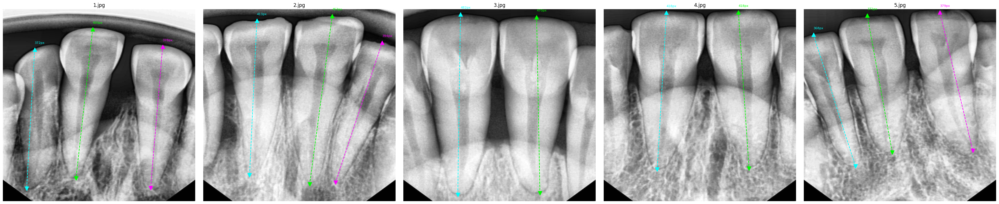

In [12]:
model.eval()
img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors    = ['cyan','lime','magenta','yellow','orange']

fig, axes = plt.subplots(1, len(img_paths), figsize=(7*len(img_paths), 7))

for ax, img_path in zip(axes, img_paths):
    img    = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    ax.imshow(img[:,:,0], cmap='gray')
    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)
        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, apexes[ai][1]*512
            c = colors[i % len(colors)]
            ax.plot(cx,  cy,  '^', color=c, markersize=10)
            ax.plot(apx, apy, 'v', color=c, markersize=10)
            ax.plot([cx,apx],[cy,apy],'--',color=c,lw=1.5)
            ax.text(cx, cy-15, f'{np.sqrt((cx-apx)**2+(cy-apy)**2):.0f}px', color=c, fontsize=8)
    ax.set_title(img_path.name)
    ax.axis('off')

plt.tight_layout()
plt.show()

# pixel length csv

In [13]:
import pandas as pd
import numpy as np
from pathlib import Path
from scipy.optimize import linear_sum_assignment

model.eval()

img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))

all_measurements = []

for img_path in img_paths:

    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(
        img.transpose(2, 0, 1)
    ).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    if len(crowns) == 0 or len(apexes) == 0:
        continue

    cost = np.abs(
        np.array(crowns)[:, 0:1] -
        np.array(apexes)[:, 0].reshape(1, -1)
    )

    row_idx, col_idx = linear_sum_assignment(cost)

    image_lengths = []

    for tooth_num, (ci, ai) in enumerate(zip(row_idx, col_idx), start=1):

        cx, cy = crowns[ci][0] * 512, crowns[ci][1] * 512
        ax, ay = apexes[ai][0] * 512, apexes[ai][1] * 512

        length_px = np.sqrt(
            (cx - ax) ** 2 +
            (cy - ay) ** 2
        )

        image_lengths.append(length_px)

        all_measurements.append({
            "image": img_path.name,
            "tooth_id": tooth_num,
            "crown_x": round(cx, 2),
            "crown_y": round(cy, 2),
            "apex_x": round(ax, 2),
            "apex_y": round(ay, 2),
            "length_px": round(length_px, 2)
        })

# Detailed measurements (one row per tooth)
df = pd.DataFrame(all_measurements)

# Summary per image
summary = (
    df.groupby("image")["length_px"]
      .agg(["count", "mean", "min", "max"])
      .reset_index()
)

summary.columns = [
    "image",
    "num_teeth",
    "avg_length_px",
    "min_length_px",
    "max_length_px"
]

# Save results
df.to_csv("tooth_lengths_pixels.csv", index=False)
summary.to_csv("image_summary_pixels.csv", index=False)

print("=== PER TOOTH MEASUREMENTS ===")
display(df)

print("\n=== PER IMAGE SUMMARY ===")
display(summary)

print(f"\nTotal teeth measured: {len(df)}")
print(f"Total images processed: {summary.shape[0]}")

=== PER TOOTH MEASUREMENTS ===


,image,tooth_id,crown_x,crown_y,apex_x,apex_y,length_px
0,1.jpg,1,84.05,106.96,62.70,477.95,371.61
1,1.jpg,2,238.45,52.85,194.21,450.38,399.98
2,1.jpg,3,424.79,99.69,392.71,475.98,377.65
3,2.jpg,1,142.57,30.10,123.17,442.27,412.63
4,2.jpg,2,343.30,17.48,283.21,466.09,452.61
5,2.jpg,3,476.23,88.58,351.83,461.93,393.53
6,3.jpg,1,151.52,12.97,144.34,494.43,481.51
7,3.jpg,2,354.30,20.53,363.02,490.29,469.83
8,4.jpg,1,166.70,9.00,142.19,426.39,418.10
9,4.jpg,2,358.41,7.99,386.74,424.61,417.58



=== PER IMAGE SUMMARY ===


,image,num_teeth,avg_length_px,min_length_px,max_length_px
0,1.jpg,3,383.080000,371.61,399.98
1,2.jpg,3,419.590000,393.53,452.61
2,3.jpg,2,475.670000,469.83,481.51
3,4.jpg,2,417.840000,417.58,418.10
4,5.jpg,3,372.746667,368.12,379.19



Total teeth measured: 13
Total images processed: 5


# Calculate Estimated Working Length
**This uses your assumption that all teeth are central incisors with an average WL of 21.5**

In [14]:
# Estimate WL from pixel lengths

AVG_WL_MM = 21.5

mean_px = df["length_px"].mean()
mm_per_pixel = AVG_WL_MM / mean_px

df["wl_mm"] = df["length_px"] * mm_per_pixel

print(f"Mean pixel length: {mean_px:.2f}")
print(f"Calibration factor: {mm_per_pixel:.5f} mm/px")

display(df[["image", "tooth_id", "length_px", "wl_mm"]])

df.to_csv("working_lengths.csv", index=False)

Mean pixel length: 408.71
Calibration factor: 0.05260 mm/px


,image,tooth_id,length_px,wl_mm
0,1.jpg,1,371.61,19.548225
1,1.jpg,2,399.98,21.040604
2,1.jpg,3,377.65,19.865954
3,2.jpg,1,412.63,21.706046
4,2.jpg,2,452.61,23.809160
5,2.jpg,3,393.53,20.701307
6,3.jpg,1,481.51,25.329420
7,3.jpg,2,469.83,24.715003
8,4.jpg,1,418.10,21.993791
9,4.jpg,2,417.58,21.966437


# Display WL on the Teeth

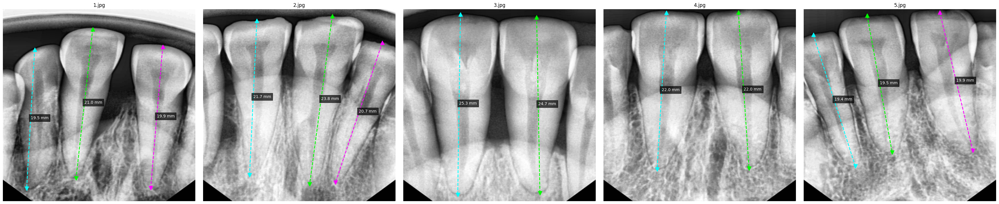

In [15]:
model.eval()

img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors = ['cyan', 'lime', 'magenta', 'yellow', 'orange']

AVG_WL_MM = 21.5
mean_px = df["length_px"].mean()
mm_per_pixel = AVG_WL_MM / mean_px

fig, axes = plt.subplots(1, len(img_paths), figsize=(7 * len(img_paths), 7))

if len(img_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, img_paths):

    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(
        img.transpose(2, 0, 1)
    ).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    ax.imshow(img[:, :, 0], cmap='gray')

    if crowns and apexes:

        cost = np.abs(
            np.array(crowns)[:, 0:1] -
            np.array(apexes)[:, 0].reshape(1, -1)
        )

        row_idx, col_idx = linear_sum_assignment(cost)

        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):

            cx, cy = crowns[ci][0] * 512, crowns[ci][1] * 512
            apx, apy = apexes[ai][0] * 512, apexes[ai][1] * 512

            length_px = np.sqrt(
                (cx - apx) ** 2 +
                (cy - apy) ** 2
            )

            wl_mm = length_px * mm_per_pixel

            c = colors[i % len(colors)]

            ax.plot(cx, cy, '^', color=c, markersize=10)
            ax.plot(apx, apy, 'v', color=c, markersize=10)

            ax.plot(
                [cx, apx],
                [cy, apy],
                '--',
                color=c,
                lw=2
            )

            mid_x = (cx + apx) / 2
            mid_y = (cy + apy) / 2

            ax.text(
                mid_x,
                mid_y,
                f'{wl_mm:.1f} mm',
                color='white',
                fontsize=10,
                bbox=dict(facecolor='black', alpha=0.7)
            )

    ax.set_title(img_path.name)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Input

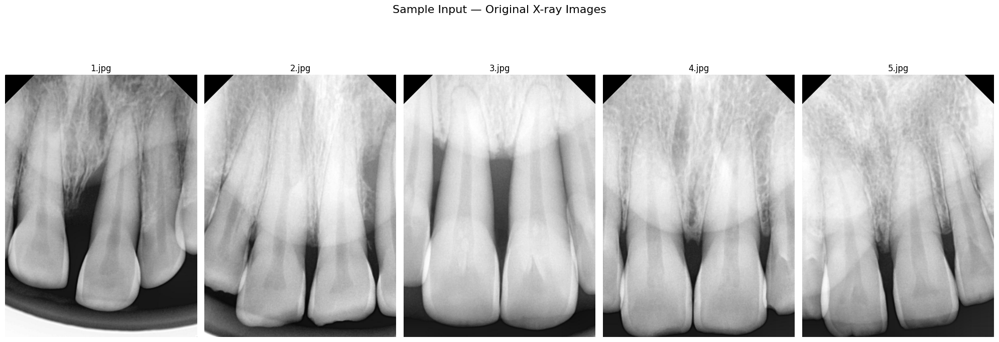

Saved


In [16]:
import cv2
import matplotlib.pyplot as plt
import os

TEACHER_DIR = '/kaggle/input/datasets/morestorage76/teacher-xrays'

teacher_images = sorted([f for f in os.listdir(TEACHER_DIR) if f.endswith('.jpg')])

fig, axes = plt.subplots(1, len(teacher_images), figsize=(20, 8))

for i, fname in enumerate(teacher_images):
    img = cv2.imread(f'{TEACHER_DIR}/{fname}')
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img_rgb)
    axes[i].set_title(fname, fontsize=12)
    axes[i].axis('off')

plt.suptitle('Sample Input — Original X-ray Images', fontsize=16)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_input.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved")

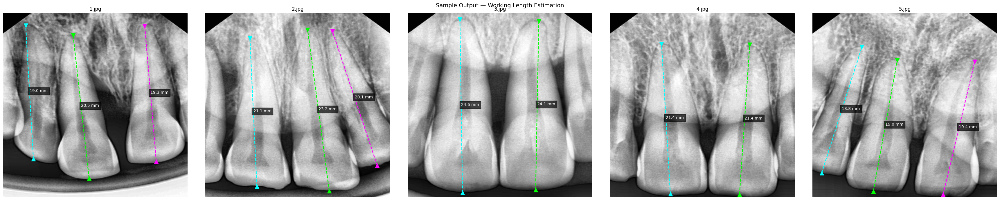

Saved


In [17]:
model.eval()
img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors = ['cyan', 'lime', 'magenta', 'yellow', 'orange']
mm_per_pixel = 21.5 / 420

fig, axes = plt.subplots(1, len(img_paths), figsize=(7 * len(img_paths), 7))
if len(img_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, img_paths):
    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    # flip display image back to original orientation
    display_img = img[:,:,0][::-1, :]  # flip vertically

    ax.imshow(display_img, cmap='gray')

    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)

        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, apexes[ai][1]*512

            # flip y coordinates to match flipped display
            cy  = 512 - cy
            apy = 512 - apy

            length_px = np.sqrt((cx-apx)**2+(cy-apy)**2)
            wl_mm = length_px * mm_per_pixel
            c = colors[i % len(colors)]

            ax.plot(cx,  cy,  '^', color=c, markersize=10)
            ax.plot(apx, apy, 'v', color=c, markersize=10)
            ax.plot([cx,apx],[cy,apy],'--',color=c,lw=2)
            ax.text((cx+apx)/2,(cy+apy)/2,f'{wl_mm:.1f} mm',
                    color='white',fontsize=10,
                    bbox=dict(facecolor='black',alpha=0.7))

    ax.set_title(img_path.name)
    ax.axis('off')

plt.suptitle('Sample Output — Working Length Estimation', fontsize=14)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_output_wl.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved")

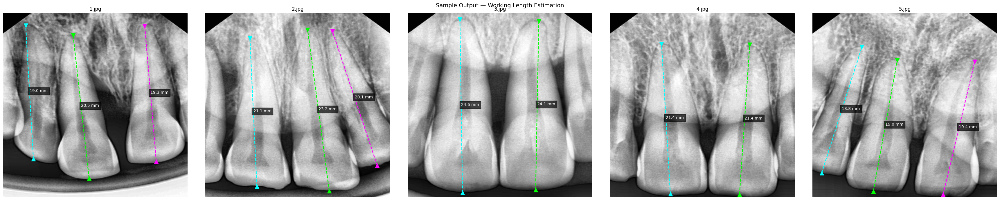

Saved


In [18]:
model.eval()
img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors = ['cyan', 'lime', 'magenta', 'yellow', 'orange']
mm_per_pixel = 21.5 / 420

fig, axes = plt.subplots(1, len(img_paths), figsize=(7*len(img_paths), 7))
if len(img_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, img_paths):
    img = load_and_preprocess(img_path, 512)  # 512x512 float
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    # flip only the display image
    display = img[:,:,0][::-1, :]
    ax.imshow(display, cmap='gray')

    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)

        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, 512 - crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, 512 - apexes[ai][1]*512
            length_px = np.sqrt((cx-apx)**2+(cy-apy)**2)
            wl_mm = length_px * mm_per_pixel
            c = colors[i % len(colors)]
            ax.plot(cx,  cy,  '^', color=c, markersize=10)
            ax.plot(apx, apy, 'v', color=c, markersize=10)
            ax.plot([cx,apx],[cy,apy],'--',color=c,lw=2)
            ax.text((cx+apx)/2,(cy+apy)/2,f'{wl_mm:.1f} mm',
                    color='white',fontsize=10,
                    bbox=dict(facecolor='black',alpha=0.7))

    ax.set_title(img_path.name)
    ax.axis('off')

plt.suptitle('Sample Output — Working Length Estimation', fontsize=14)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_output_wl.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved")

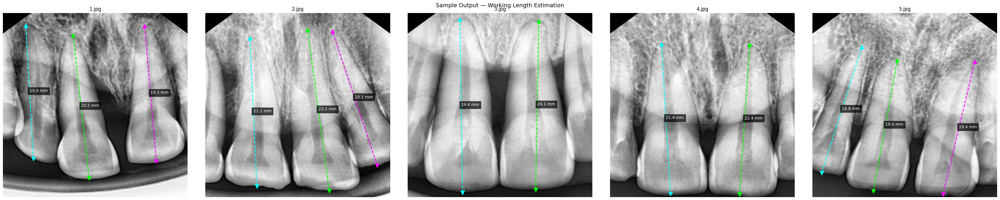

Saved


In [19]:
model.eval()
img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors = ['cyan', 'lime', 'magenta', 'yellow', 'orange']
mm_per_pixel = 21.5 / 420

fig, axes = plt.subplots(1, len(img_paths), figsize=(7*len(img_paths), 7))
if len(img_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, img_paths):
    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    display = img[:,:,0][::-1, :]
    ax.imshow(display, cmap='gray')

    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)

        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, 512 - crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, 512 - apexes[ai][1]*512
            length_px = np.sqrt((cx-apx)**2+(cy-apy)**2)
            wl_mm = length_px * mm_per_pixel
            c = colors[i % len(colors)]

            # after flip: crown is at bottom, apex at top
            ax.plot(cx,  cy,  'v', color=c, markersize=10)   # crown at bottom
            ax.plot(apx, apy, '^', color=c, markersize=10)   # apex at top
            ax.plot([cx,apx],[cy,apy],'--',color=c,lw=2)
            ax.text((cx+apx)/2,(cy+apy)/2,f'{wl_mm:.1f} mm',
                    color='white',fontsize=10,
                    bbox=dict(facecolor='black',alpha=0.7))

    ax.set_title(img_path.name)
    ax.axis('off')

plt.suptitle('Sample Output — Working Length Estimation', fontsize=14)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_output_wl.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved")

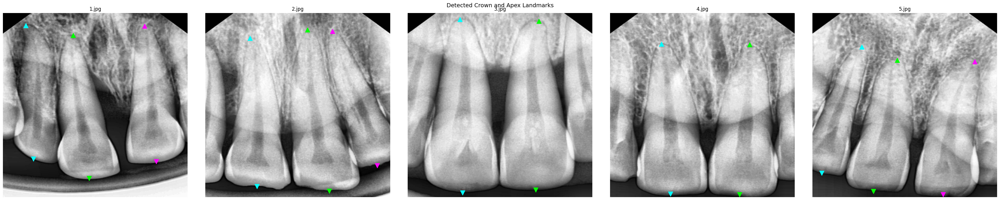

Saved


In [20]:
model.eval()
img_paths = sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg'))
colors = ['cyan', 'lime', 'magenta', 'yellow', 'orange']

fig, axes = plt.subplots(1, len(img_paths), figsize=(7*len(img_paths), 7))
if len(img_paths) == 1:
    axes = [axes]

for ax, img_path in zip(axes, img_paths):
    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    display = img[:,:,0][::-1, :]
    ax.imshow(display, cmap='gray')

    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)

        for i, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, 512 - crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, 512 - apexes[ai][1]*512
            c = colors[i % len(colors)]
            ax.plot(cx,  cy,  'v', color=c, markersize=12, label='Crown' if i==0 else '')
            ax.plot(apx, apy, '^', color=c, markersize=12, label='Apex' if i==0 else '')

    ax.set_title(img_path.name)
    ax.axis('off')

plt.suptitle('Detected Crown and Apex Landmarks', fontsize=14)
plt.tight_layout()
plt.savefig('/kaggle/working/sample_landmarks.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved")

In [21]:
import pandas as pd

mm_per_pixel = 21.5 / 420
rows = []

for img_path in sorted(Path('/kaggle/working/teacher_flipped').glob('*.jpg')):
    img = load_and_preprocess(img_path, 512)
    tensor = torch.from_numpy(img.transpose(2,0,1)).unsqueeze(0).to(device)

    with torch.no_grad():
        hm = model(tensor)[0].cpu().numpy()

    crowns = find_peaks(hm[0], threshold=0.3)
    apexes = find_peaks(hm[1], threshold=0.3)

    if crowns and apexes:
        cost = np.abs(np.array(crowns)[:,0:1] - np.array(apexes)[:,0].reshape(1,-1))
        row_idx, col_idx = linear_sum_assignment(cost)

        for t, (ci, ai) in enumerate(zip(row_idx, col_idx)):
            cx,  cy  = crowns[ci][0]*512, crowns[ci][1]*512
            apx, apy = apexes[ai][0]*512, apexes[ai][1]*512
            length_px = np.sqrt((cx-apx)**2+(cy-apy)**2)
            wl_mm = round(length_px * mm_per_pixel, 1)
            rows.append({
                'Image':   img_path.name,
                'Tooth':   t+1,
                'WL (mm)': wl_mm,
                'Status':  'Normal' if 18 <= wl_mm <= 26 else 'Review'
            })

df_results = pd.DataFrame(rows)
print(df_results.to_string(index=False))
df_results.to_csv('/kaggle/working/wl_results_final.csv', index=False)
print("\nSaved wl_results_final.csv")

Image  Tooth  WL (mm) Status
1.jpg      1     19.0 Normal
1.jpg      2     20.5 Normal
1.jpg      3     19.3 Normal
2.jpg      1     21.1 Normal
2.jpg      2     23.2 Normal
2.jpg      3     20.1 Normal
3.jpg      1     24.6 Normal
3.jpg      2     24.1 Normal
4.jpg      1     21.4 Normal
4.jpg      2     21.4 Normal
5.jpg      1     18.8 Normal
5.jpg      2     19.0 Normal
5.jpg      3     19.4 Normal

Saved wl_results_final.csv
